In [1]:
# uncomment this if you want to use interactive plot (only works in Jupyter not works in VScode)
# %matplotlib widget
import scanpy as sc
import numpy as np
import pandas as pd
import torch

import scSLAT
from scSLAT.model import load_anndatas, Cal_Spatial_Net, run_SLAT, scanpy_workflow, spatial_match
from scSLAT.viz import match_3D_multi, hist, Sankey, match_3D_celltype, Sankey
from scSLAT.metrics import region_statistics


/groups/tanaka/People/current/jiwang/local/anaconda3/envs/scSLAT/lib/python3.8/site-packages/torch_geometric/typing.py:68: UserWarning: An issue occurred while importing 'pyg-lib'. Disabling its usage. Stacktrace: /lib/x86_64-linux-gnu/libm.so.6: version `GLIBC_2.29' not found (required by /groups/tanaka/People/current/jiwang/local/anaconda3/envs/scSLAT/lib/python3.8/site-packages/libpyg.so)
  warnings.warn(f"An issue occurred while importing 'pyg-lib'. "
/groups/tanaka/People/current/jiwang/local/anaconda3/envs/scSLAT/lib/python3.8/site-packages/torch_geometric/typing.py:124: UserWarning: An issue occurred while importing 'torch-sparse'. Disabling its usage. Stacktrace: /lib/x86_64-linux-gnu/libm.so.6: version `GLIBC_2.29' not found (required by /groups/tanaka/People/current/jiwang/local/anaconda3/envs/scSLAT/lib/python3.8/site-packages/libpyg.so)
  warnings.warn(f"An issue occurred while importing 'torch-sparse'. "


In [2]:
sc.set_figure_params(scanpy=True, dpi=100, dpi_save=150, frameon=True, vector_friendly=True, fontsize=14)
sc.set_figure_params(dpi=100, dpi_save=150)

In [3]:
import sys
import os
import pandas as pd
os.getcwd()

input_Dir = "/groups/tanaka/People/current/jiwang/projects/heart_regeneration/results/visium_axolotl_R17246_R12830_allVisium_20240905/Replicates_comparison_with_segmentation/"

In [4]:
## import d4 rep1 
#adata1 = sc.read_h5ad('/groups/tanaka/People/current/jiwang/projects/heart_regeneration/data/test_slat/Chen-Stereo_seq-E15.5-s1.h5ad')
adata2 = sc.read_h5ad(os.path.join(input_Dir, 'ST_visium_Amex_d4_294947.h5ad'))
#adata1 = sc.read_visium(path = '/groups/tanaka/People/current/jiwang/projects/heart_regeneration/R17246_visium_axolotl/nf_out/Amex_d4_183624',
#                       count_file = )
all = pd.read_csv(os.path.join(input_Dir, 'image_coordinates_Amex_d4_294947.csv'), delimiter = ',',index_col=0)
#del all[all. columns[0]] # removed barcodes 

all = all.to_numpy()
adata2.obsm["spatial"] = all


In [5]:
## import d4 rep2 
#adata1 = sc.read_h5ad('/groups/tanaka/People/current/jiwang/projects/heart_regeneration/data/test_slat/Chen-Stereo_seq-E15.5-s1.h5ad')
adata1 = sc.read_h5ad(os.path.join(input_Dir, 'ST_visium_Amex_d4_183624.h5ad'))
#adata1 = sc.read_visium(path = '/groups/tanaka/People/current/jiwang/projects/heart_regeneration/R17246_visium_axolotl/nf_out/Amex_d4_183624',
#                       count_file = )
all = pd.read_csv(os.path.join(input_Dir, 'image_coordinates_Amex_d4_183624.csv'), delimiter = ',',index_col=0)
#del all[all. columns[0]] # removed barcodes 

all = all.to_numpy()
adata1.obsm["spatial"] = all


In [6]:
adata1

AnnData object with n_obs × n_vars = 897 × 36404
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'condition', 'sampleid', 'nCount_SCT', 'nFeature_SCT', 'percent.mt', 'SCT_snn_res.0.7', 'seurat_clusters', 'time', 'segmentation', 'cell.id', 'seg_ventricle', 'image_row', 'image_col'
    var: 'features'
    obsm: 'spatial'

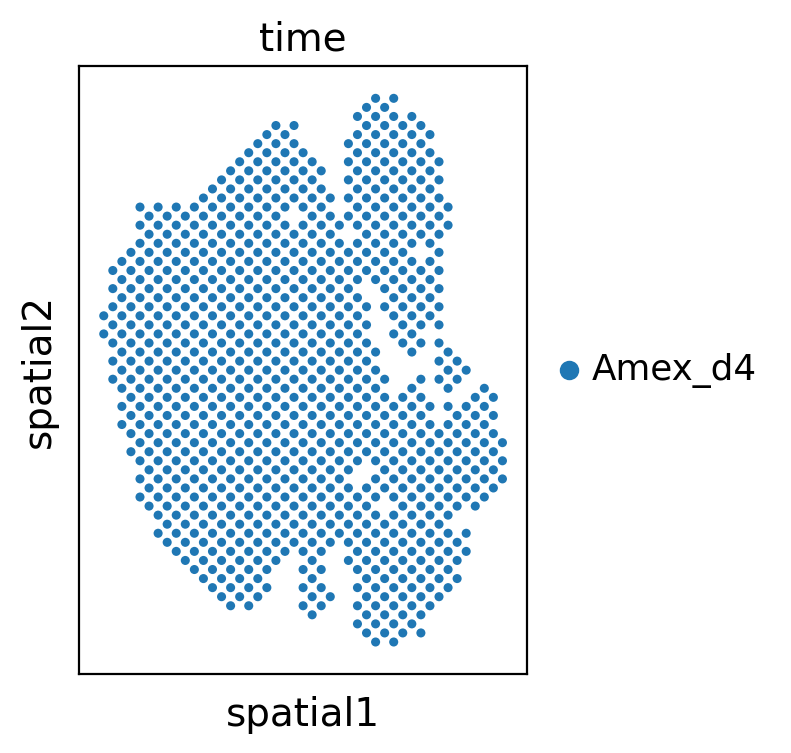

In [7]:
sc.pl.spatial(adata1, color="time", spot_size=1)

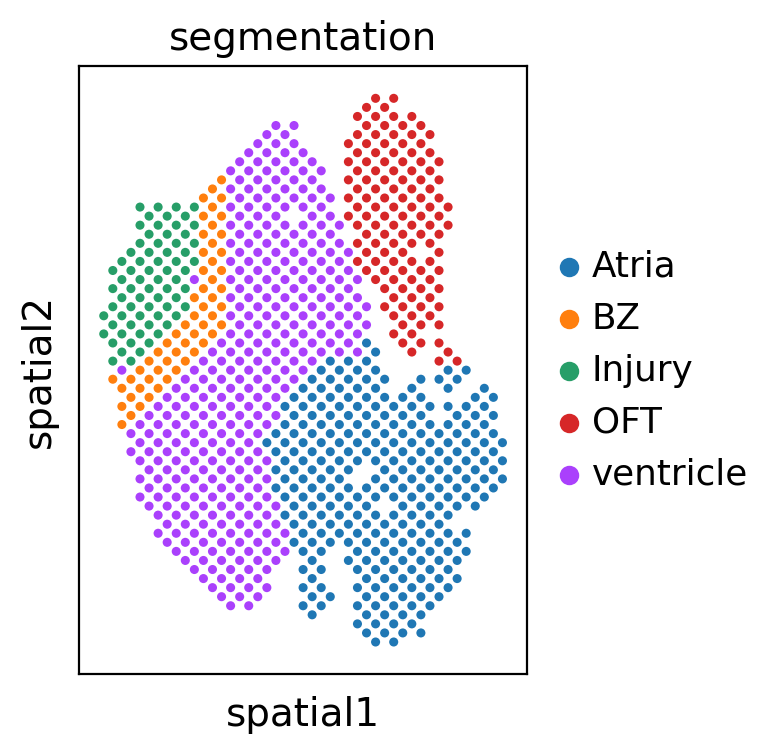

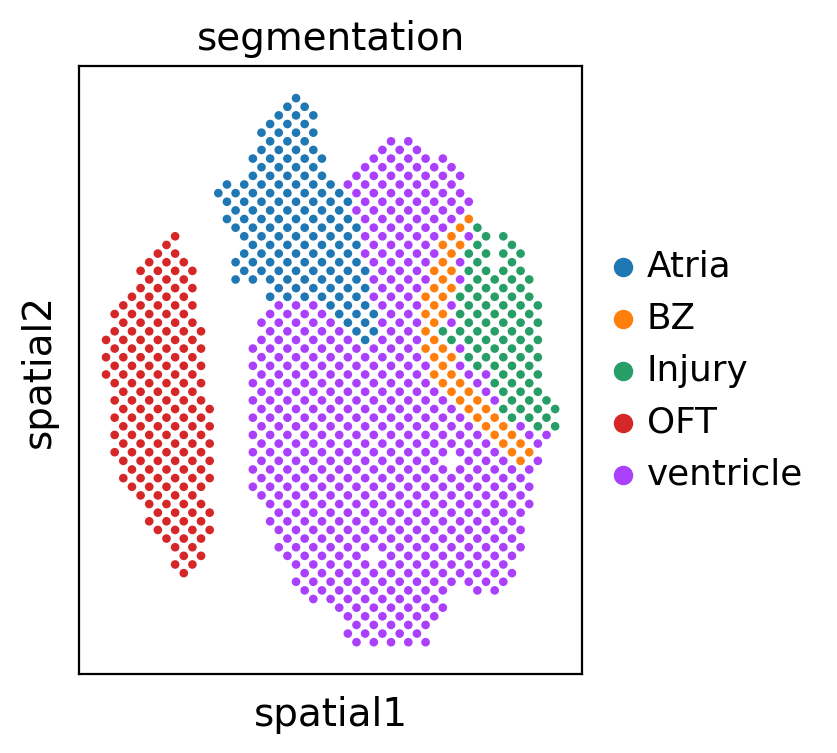

In [8]:
sc.pl.spatial(adata1, color="segmentation", spot_size=1)
sc.pl.spatial(adata2, color="segmentation", spot_size=1)

In [9]:
#Cal_Spatial_Net(adata1, k_cutoff=20, model='KNN')
#Cal_Spatial_Net(adata2, k_cutoff=20, model='KNN')
Cal_Spatial_Net(adata1, k_cutoff=20, model='KNN')
Cal_Spatial_Net(adata2, k_cutoff=20, model='KNN')
edges, features = load_anndatas([adata1, adata2], feature='DPCA', check_order=False)

Calculating spatial neighbor graph ...
The graph contains 19233 edges, 897 cells.
21.441471571906355 neighbors per cell on average.
Calculating spatial neighbor graph ...
The graph contains 22152 edges, 1032 cells.
21.46511627906977 neighbors per cell on average.
Use DPCA feature to format graph


/groups/tanaka/People/current/jiwang/local/anaconda3/envs/scSLAT/lib/python3.8/site-packages/anndata/_core/anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(
/groups/tanaka/People/current/jiwang/local/anaconda3/envs/scSLAT/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:64: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(
/groups/tanaka/People/current/jiwang/local/anaconda3/envs/scSLAT/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/groups/tanaka/People/current/jiwang/local/anaconda3/envs/scSLAT/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of

In [10]:
#embd0, embd1, time = run_SLAT(features, edges)
embd0, embd1, time = run_SLAT(features, edges, LGCN_layer=1)

GPU is not available
Running
---------- epochs: 1 ----------
---------- epochs: 2 ----------
---------- epochs: 3 ----------
---------- epochs: 4 ----------
---------- epochs: 5 ----------
---------- epochs: 6 ----------
Training model time: 10.78


In [11]:
#best, index, distance = spatial_match(features, adatas=[adata1, adata2], reorder=False)
best, index, distance = spatial_match([embd0, embd1], reorder=False, adatas=[adata1,adata2])

In [12]:
#adata1_df = pd.DataFrame({'index': range(embd0.shape[0]),
#                        'x': adata1.obsm['spatial'][:,0],
#                        'y': adata1.obsm['spatial'][:,1],
#                        'celltype': adata1.obs['segmentation']})
#adata2_df = pd.DataFrame({'index': range(embd1.shape[0]),
#                        'x': adata2.obsm['spatial'][:,0],
#                        'y': adata2.obsm['spatial'][:,1],
#                        'celltype': adata2.obs['segmentation']})
#matching = np.array([range(index.shape[0]), best])
#best_match = distance[:,0]

adata1_df = pd.DataFrame({'index':range(embd0.shape[0]),
                          'x': adata1.obsm['spatial'][:,0],
                          'y': adata1.obsm['spatial'][:,1],
                          'celltype':adata1.obs['segmentation']})
adata2_df = pd.DataFrame({'index':range(embd1.shape[0]),
                          'x': adata2.obsm['spatial'][:,0],
                          'y': adata2.obsm['spatial'][:,1],
                          'celltype':adata2.obs['segmentation']})
matching = np.array([range(index.shape[0]), best])
best_match = distance[:,0]
region_statistics(best_match, start=0.5, number_of_interval=10)


0.500~0.550       226         21.899%
0.550~0.600       233         22.578%
0.600~0.650       144         13.953%
0.650~0.700        85          8.236%
0.700~0.750        43          4.167%
0.750~0.800        22          2.132%
0.800~0.850         6          0.581%
0.850~0.900         2          0.194%
0.900~0.950         0          0.000%
0.950~1.000         0          0.000%


In [13]:
#multi_align = match_3D_multi(adata1_df, adata2_df, matching, meta='celltype',
#                            scale_coordinate=True, subsample_size=500)
#multi_align.draw_3D(size=[7, 8], line_width=0.7, point_size=[1.5,1.5], hide_axis=True)

multi_align = match_3D_multi(adata1_df, adata2_df, matching, meta='celltype', rotate = ['x','y'], 
                             scale_coordinate=False, subsample_size=500, exchange_xy=False)

dataset1: 5 cell types; dataset2: 5 cell types; 
                    Total :5 celltypes; Overlap: 5 cell types 
                    Not overlap :[[]]
Subsampled 500 pairs from 1032


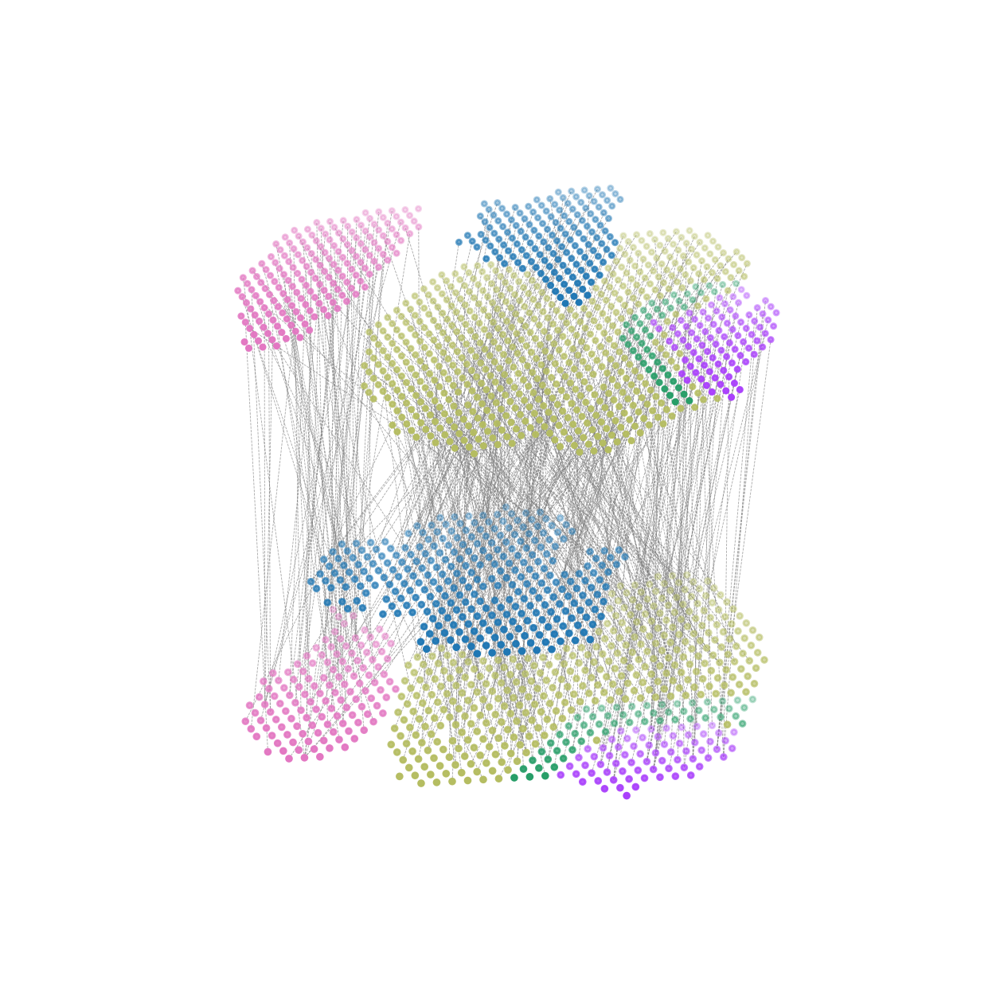

In [14]:
multi_align.draw_3D(size=[8, 8], line_width = 0.3, point_size=[6.0,5.0], hide_axis=True, show_error=False, 
                    save= os.path.join(input_Dir, '3D_align_twoRep_day4.pdf'))

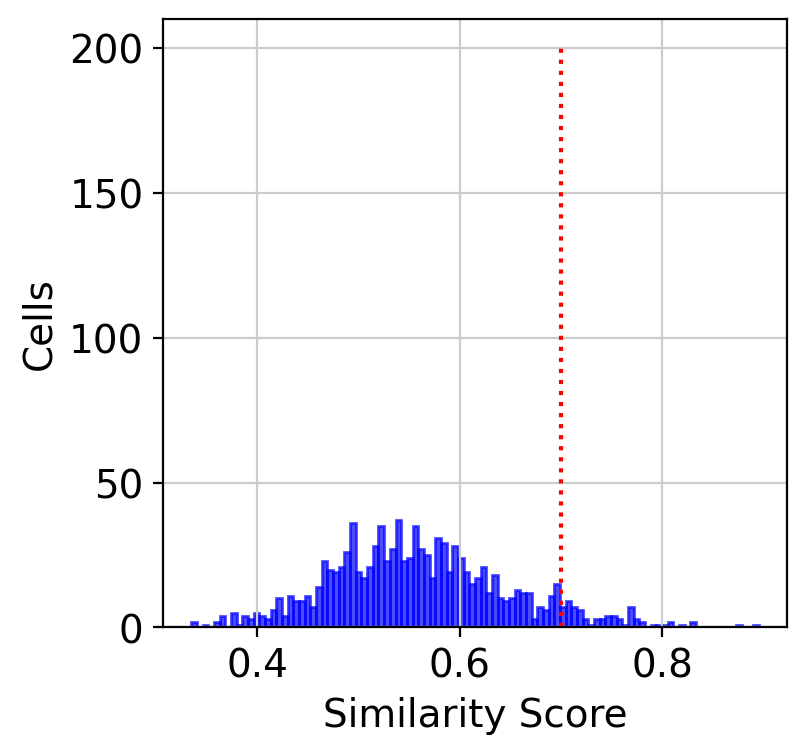

In [15]:
%matplotlib inline
hist(best_match, cut=0.7)

In [16]:
#adata2.obs['low_quality_index'] = best_match
#adata2.obs['low_quality_index'] = adata2.obs['low_quality_index'].astype(float)
adata2.obs['low_quality_index']= best_match
adata2.obs['low_quality_index'] = adata2.obs['low_quality_index'].astype(float)

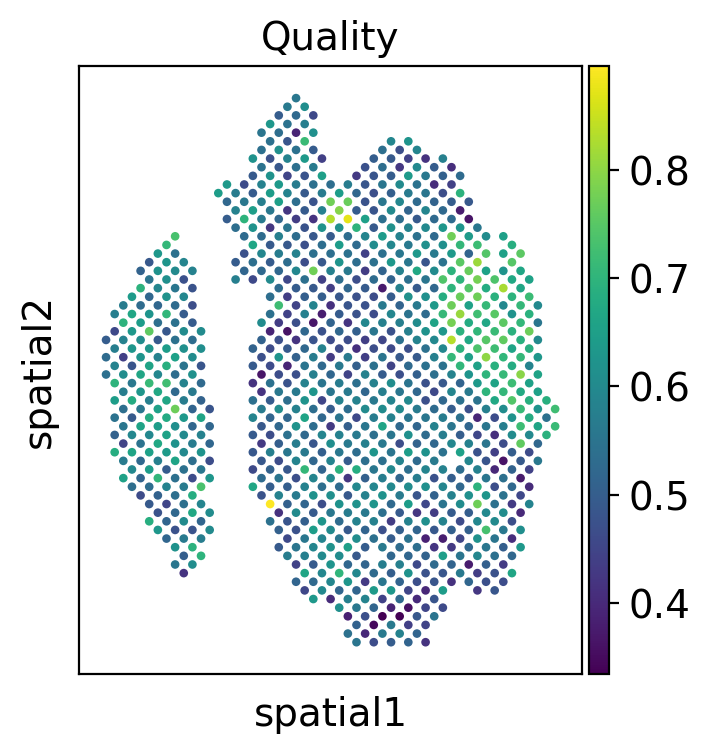

In [17]:
#sc.pl.spatial(adata2, color='low_quality_index', spot_size=1, title='Quality')
sc.pl.spatial(adata2, color='low_quality_index', spot_size=1, title='Quality')
#sc.pl.spatial(adata1, color='low_quality_index', spot_size=1, title='Quality')

In [18]:
adata2_df['target_celltype'] = adata1_df.iloc[matching[1,:],:]['celltype'].to_list()
matching_table = adata2_df.groupby(['celltype', 'target_celltype']).size().unstack(fill_value=0)

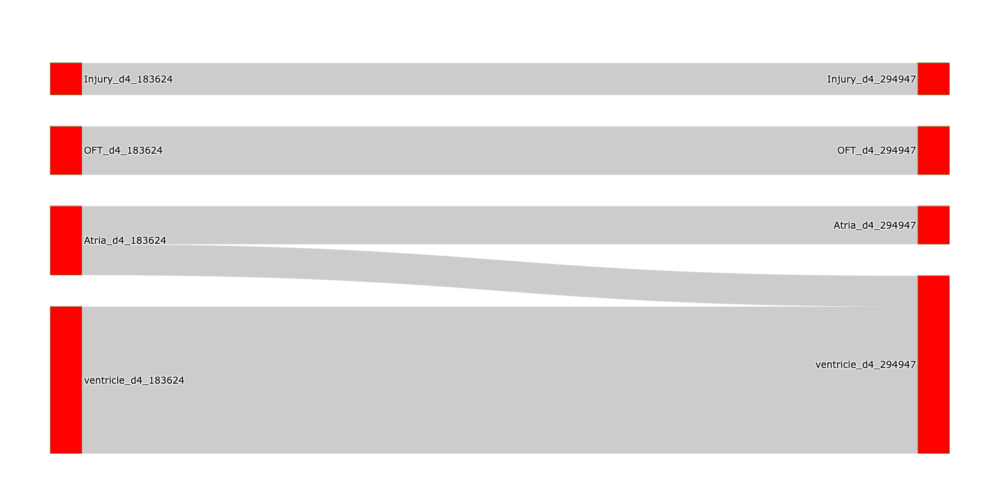

In [19]:
Sankey(matching_table, layout=[1000,800], font_size=15, prefix=['d4_183624','d4_294947'])
#Sankey(matching_table, prefix=['E15.5_E1S1','E15.5_E1S2'])

In [20]:
adata1

AnnData object with n_obs × n_vars = 897 × 36404
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'condition', 'sampleid', 'nCount_SCT', 'nFeature_SCT', 'percent.mt', 'SCT_snn_res.0.7', 'seurat_clusters', 'time', 'segmentation', 'cell.id', 'seg_ventricle', 'image_row', 'image_col'
    var: 'features'
    uns: 'time_colors', 'segmentation_colors', 'Spatial_Net'
    obsm: 'spatial'

In [21]:
adata1.obs['segmentation']

TTAACCAACCCTCCCT-1_2_1    Injury
TTGCTGAAGGAACCAC-1_2_1    Injury
CTCCGGCCTAATATGC-1_2_1    Injury
TTGTGGCCCTGACAGT-1_2_1    Injury
TCGCCGGTCGATCCGT-1_2_1    Injury
                           ...  
TAGGTGACGATAACCT-1_2_1     Atria
CGGATCCTCAAGGACT-1_2_1     Atria
CAGCAGTCTGTGCTGC-1_2_1     Atria
TTAATTGCTTTGGGTG-1_2_1     Atria
TTGCCGCTTTCTAGTA-1_2_1     Atria
Name: segmentation, Length: 897, dtype: category
Categories (5, object): ['Atria', 'BZ', 'Injury', 'OFT', 'ventricle']

In [22]:
matching
adata1_df

,index,x,y,celltype
TTAACCAACCCTCCCT-1_2_1,0,19,55,Injury
TTGCTGAAGGAACCAC-1_2_1,1,19,57,Injury
CTCCGGCCTAATATGC-1_2_1,2,19,59,Injury
TTGTGGCCCTGACAGT-1_2_1,3,18,60,Injury
TCGCCGGTCGATCCGT-1_2_1,4,19,61,Injury
...,...,...,...,...
TAGGTGACGATAACCT-1_2_1,892,61,79,Atria
CGGATCCTCAAGGACT-1_2_1,893,60,80,Atria
CAGCAGTCTGTGCTGC-1_2_1,894,62,74,Atria
TTAATTGCTTTGGGTG-1_2_1,895,62,76,Atria


In [23]:
kidney_align = match_3D_celltype(adata1_df, adata2_df, matching, meta='celltype', highlight_celltype = [['Injury'],['Injury']],
                                 subsample_size=1000, highlight_line = ['darkgray'], scale_coordinate = True, rotate = ['x','y'])

dataset1: 5 cell types; dataset2: 5 cell types; 
                    Total :5 celltypes; Overlap: 5 cell types 
                    Not overlap :[[]]
Subsampled 1000 pairs from 1032


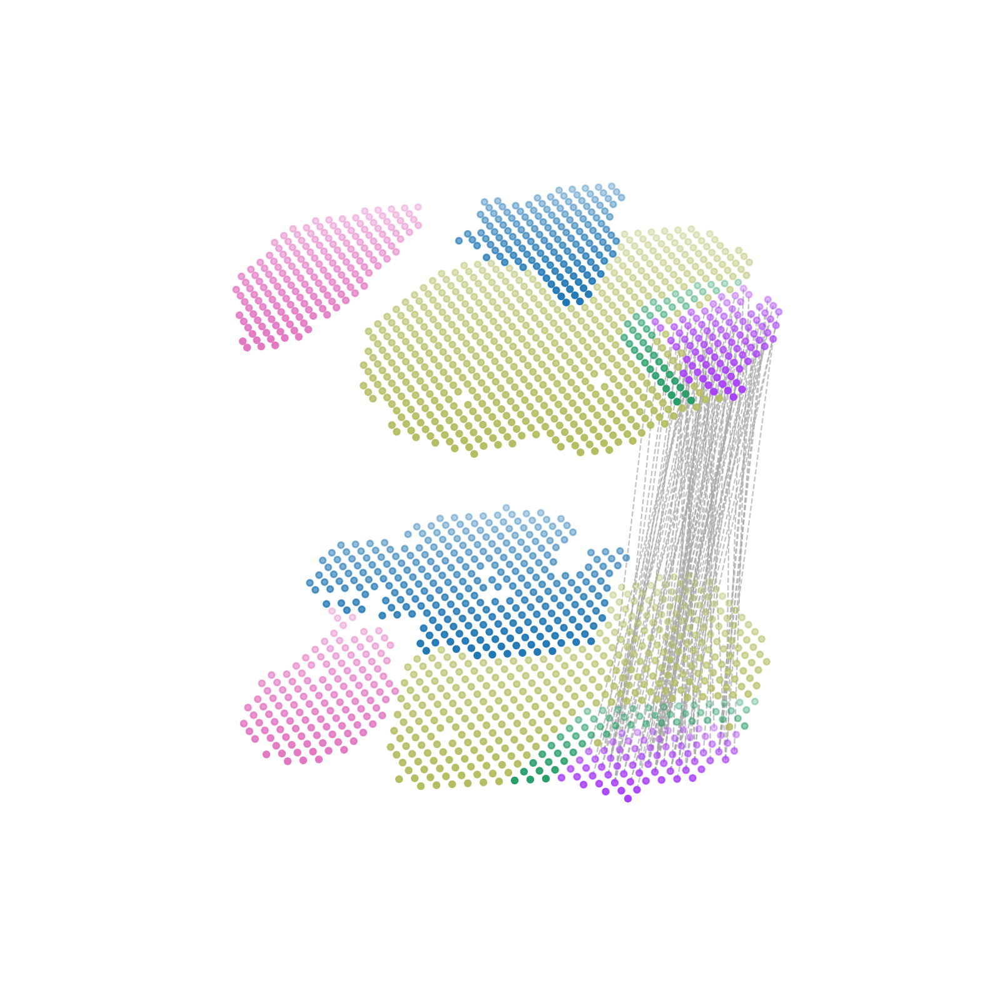

In [24]:
kidney_align.draw_3D(size= [10, 12], line_width =0.8, point_size=[12.0, 12.0], hide_axis=True)

dataset1: 5 cell types; dataset2: 5 cell types; 
                    Total :5 celltypes; Overlap: 5 cell types 
                    Not overlap :[[]]
Subsampled 500 pairs from 1032


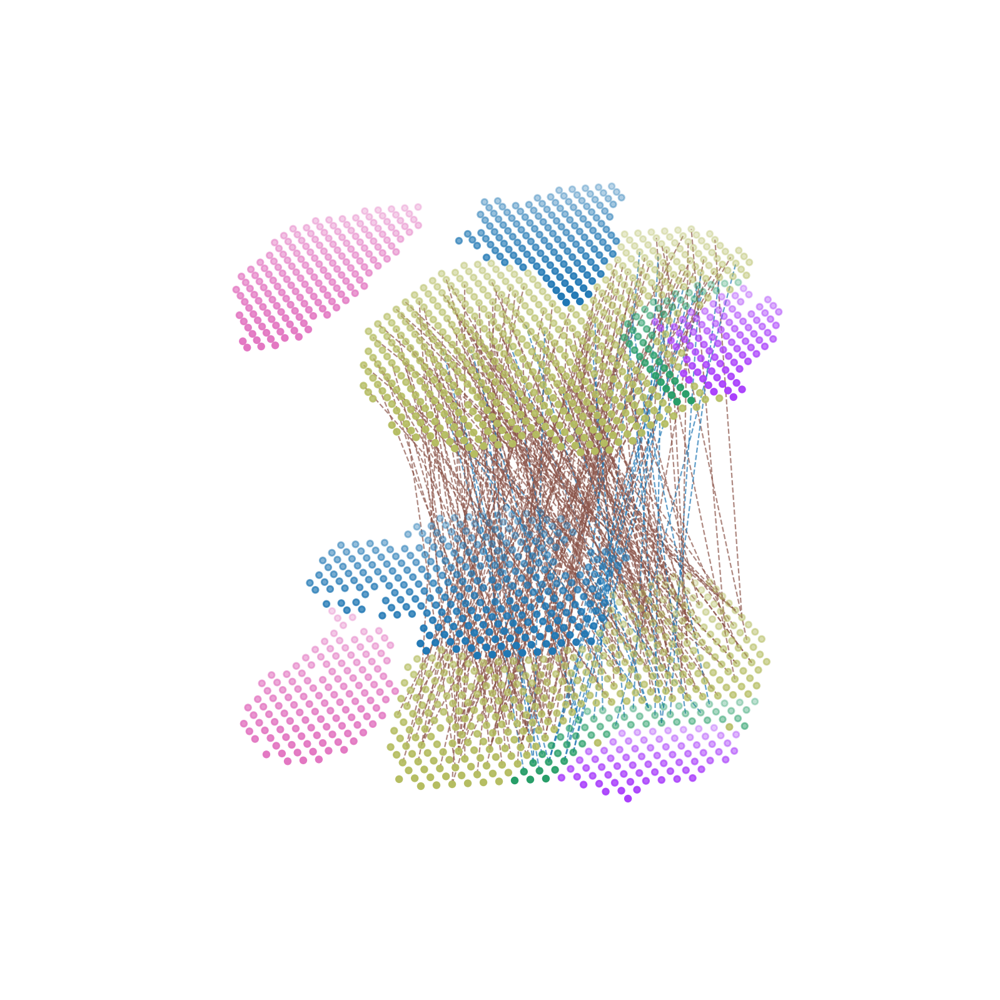

In [25]:
kidney_align = match_3D_celltype(adata1_df, adata2_df, matching, meta='celltype', highlight_celltype = [['BZ', 'ventricle'],['BZ', 'ventricle']],
                                 subsample_size=500, highlight_line = ['darkgray'], scale_coordinate = True, rotate = ['x','y'])
kidney_align.draw_3D(size= [10, 12], line_width =0.8, point_size=[12.0, 12.0], hide_axis=True)

dataset1: 5 cell types; dataset2: 5 cell types; 
                    Total :5 celltypes; Overlap: 5 cell types 
                    Not overlap :[[]]
Subsampled 500 pairs from 1032


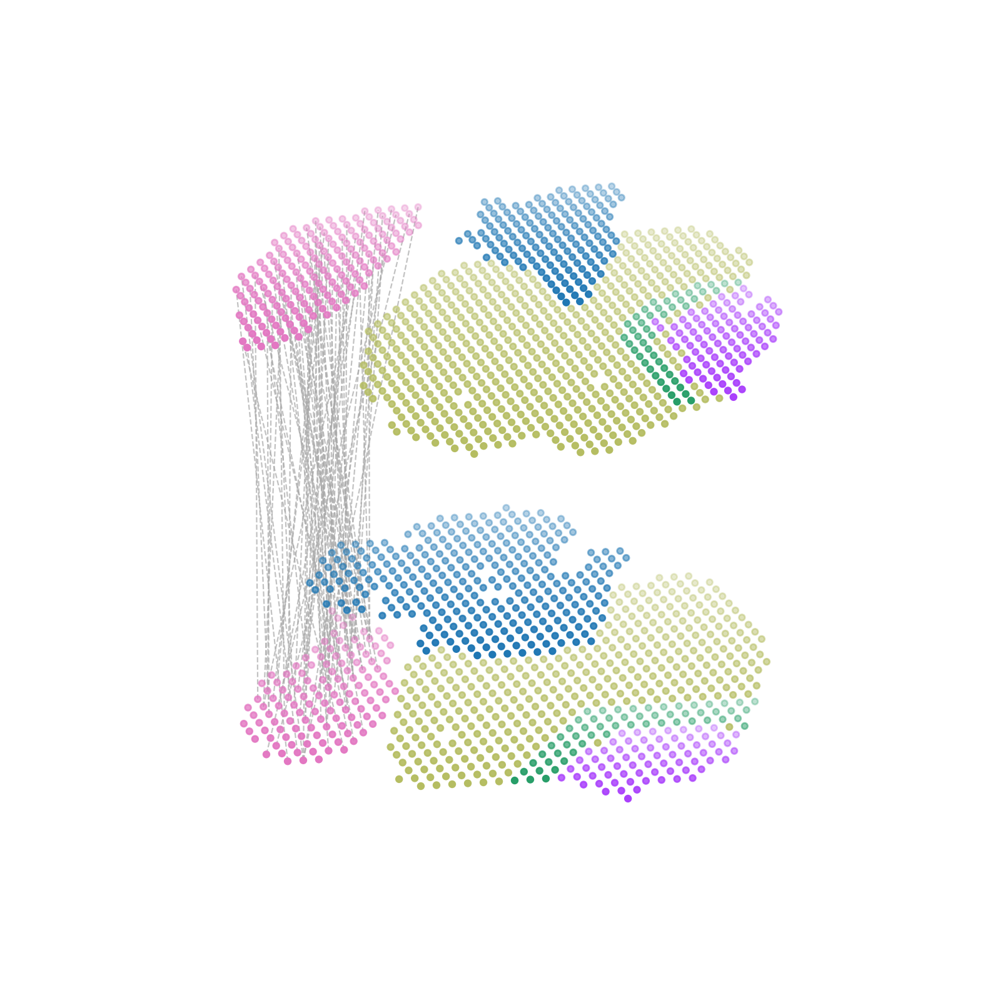

In [26]:
kidney_align = match_3D_celltype(adata1_df, adata2_df, matching, meta='celltype', highlight_celltype = [['OFT'],['OFT']],
                                 subsample_size=500, highlight_line = ['darkgray'], scale_coordinate = True, rotate = ['x','y'])
kidney_align.draw_3D(size= [10, 12], line_width =0.8, point_size=[12.0, 12.0], hide_axis=True)

dataset1: 5 cell types; dataset2: 5 cell types; 
                    Total :5 celltypes; Overlap: 5 cell types 
                    Not overlap :[[]]
Subsampled 500 pairs from 1032


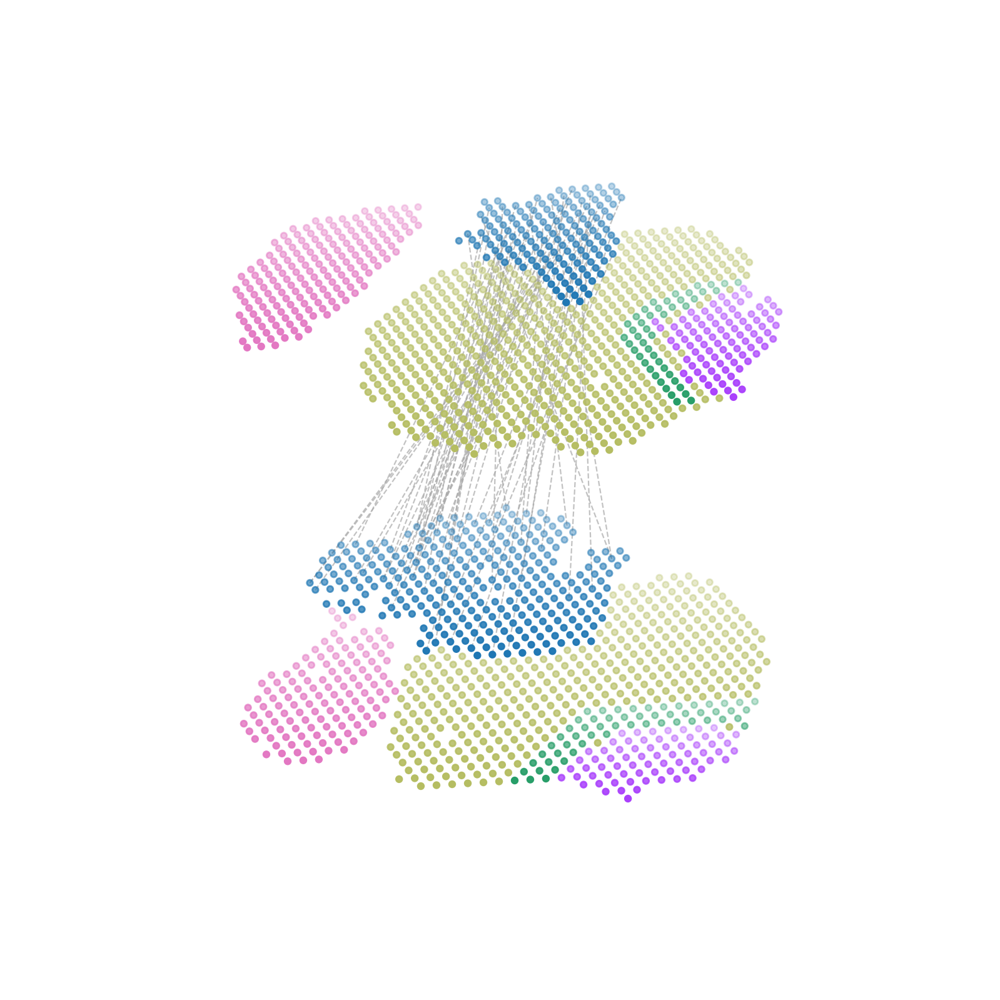

In [27]:
kidney_align = match_3D_celltype(adata1_df, adata2_df, matching, meta='celltype', highlight_celltype = [['Atria'],['Atria']],
                                 subsample_size=500, highlight_line = ['darkgray'], scale_coordinate = True, rotate = ['x','y'])
kidney_align.draw_3D(size= [10, 12], line_width =0.8, point_size=[12.0, 12.0], hide_axis=True)